# Erwin Antepuesto
### Instructions
#### Support Vector Machines 
1. Use any dataset from https://archive.ics.uci.edu/datasets?Task=Clustering&skip=0&take=10&sort=desc&orderBy=NumHits&search=&Area=Biology
2. Each student should have a unique dataset otherwise no points will be given, so you need to discuss with your classmate.

Dataset: National Poll on Healthy Aging (NPHA)

Link: https://archive.ics.uci.edu/dataset/936/national+poll+on+healthy+aging+(npha)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import GridSearchCV

In [2]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
national_poll_on_healthy_aging_npha = fetch_ucirepo(id=936) 
  
# data (as pandas dataframes) 
X = national_poll_on_healthy_aging_npha.data.features 
y = national_poll_on_healthy_aging_npha.data.targets  

In [3]:
# metadata 
print(national_poll_on_healthy_aging_npha.metadata) 
  
# variable information 
print(national_poll_on_healthy_aging_npha.variables)

{'uci_id': 936, 'name': 'National Poll on Healthy Aging (NPHA)', 'repository_url': 'https://archive.ics.uci.edu/dataset/936/national+poll+on+healthy+aging+(npha)', 'data_url': 'https://archive.ics.uci.edu/static/public/936/data.csv', 'abstract': 'This is a subset of the NPHA dataset filtered down to develop and validate machine learning algorithms for predicting the number of doctors a survey respondent sees in a year. This dataset’s records represent seniors who responded to the NPHA survey.\n', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular'], 'num_instances': 714, 'num_features': 14, 'feature_types': ['Categorical'], 'demographics': ['Age', 'Race', 'Gender'], 'target_col': ['Number_of_Doctors_Visited'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2017, 'last_updated': 'Mon Dec 11 2023', 'dataset_doi': 'https://doi.org/10.3886/ICPSR37305.v1', 'creators': [], 'intro_paper': {'title'

**TASK: Take 10 moderately sized subsamples your dataset and create a correlation plot for each subsample**

In [4]:
# Function to split data into training and test sets
def split_data(X, y):
    return train_test_split(X, y, test_size=0.2, random_state=42)

def create_subsamples_and_plot_correlations(subsample_size):
    subsamples = []
    for i in range(10):
        # Randomly select rows from the dataframe
        sample_indices = np.random.choice(len(X), size=subsample_size, replace=False)
        subsample = X.iloc[sample_indices]
        subsamples.append(subsample)
    
    for subsample in subsamples:
        corr = subsample.corr()
        plt.figure(figsize=(12, 8))
        sns.heatmap(corr, annot=True, cmap='coolwarm')
        plt.title(f'Correlation Heatmap - Subsample {i+1}')
        plt.show()


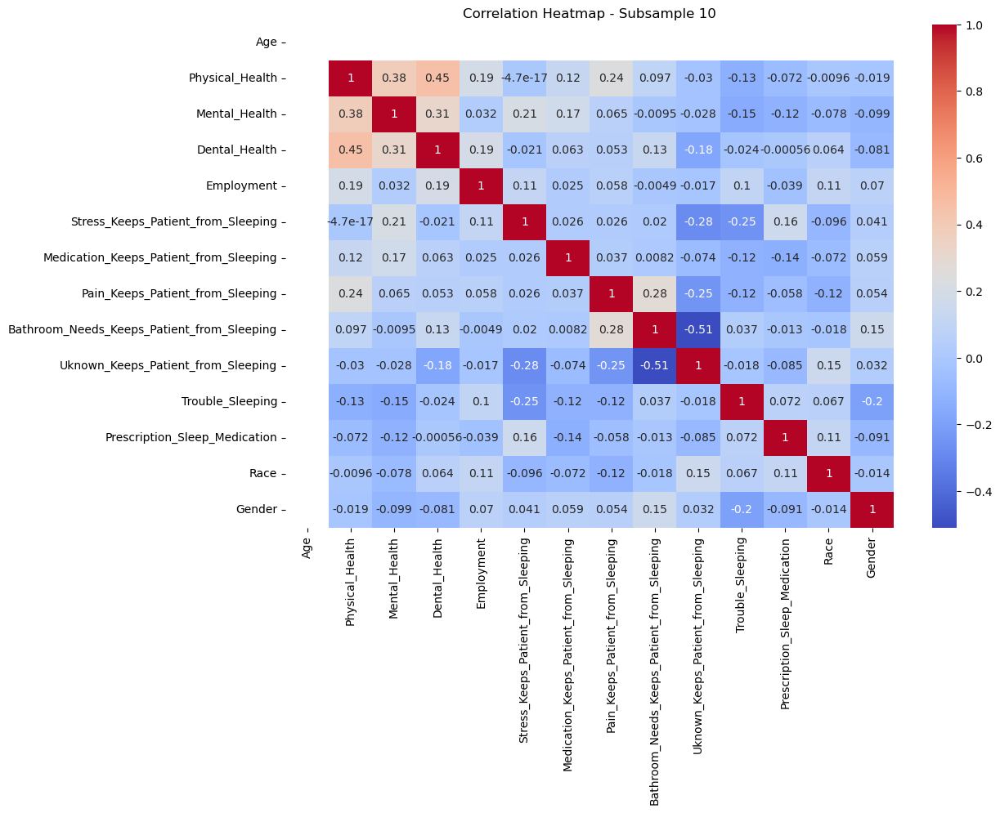

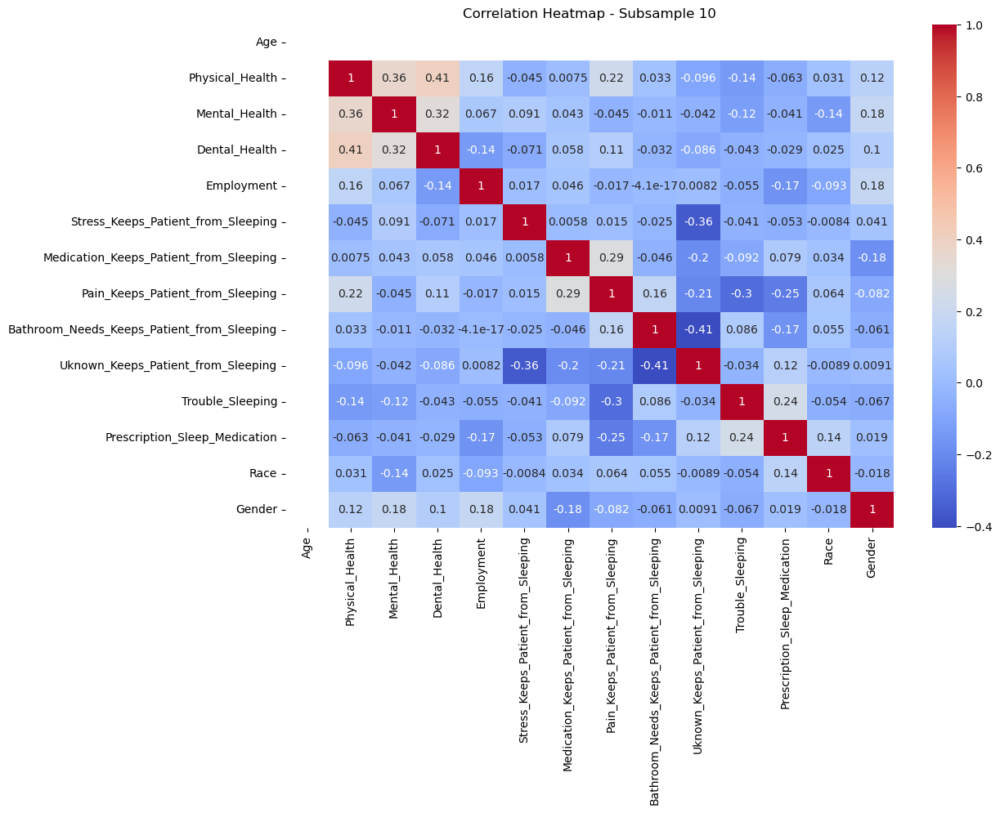

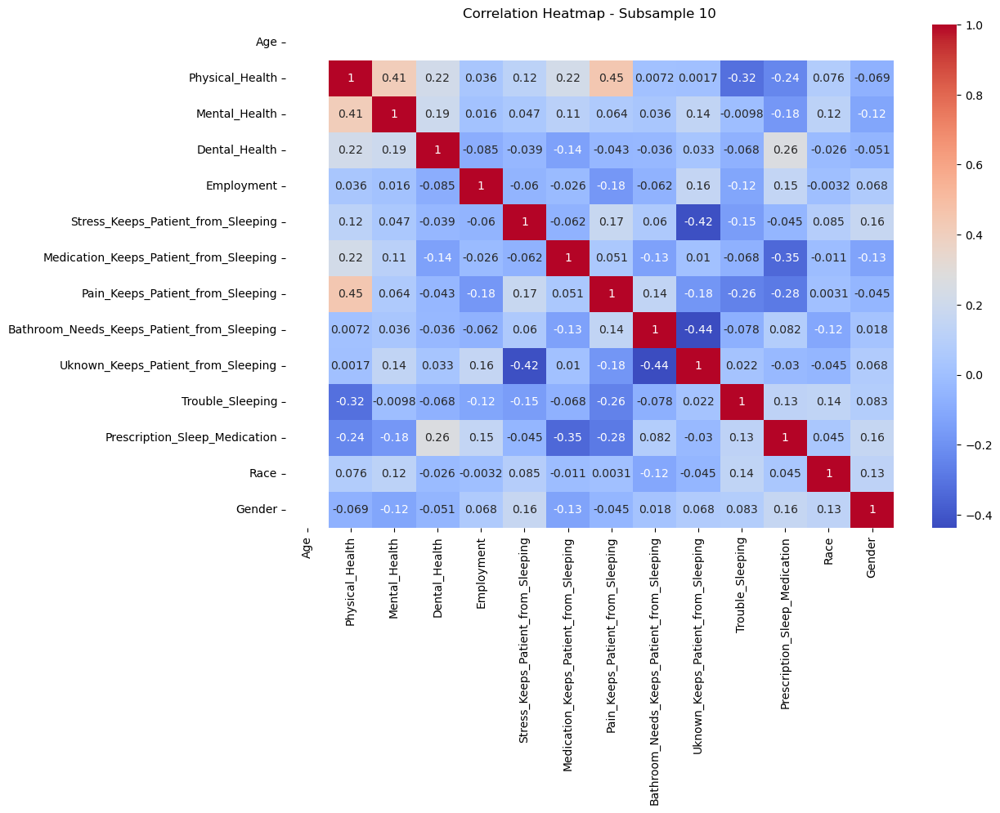

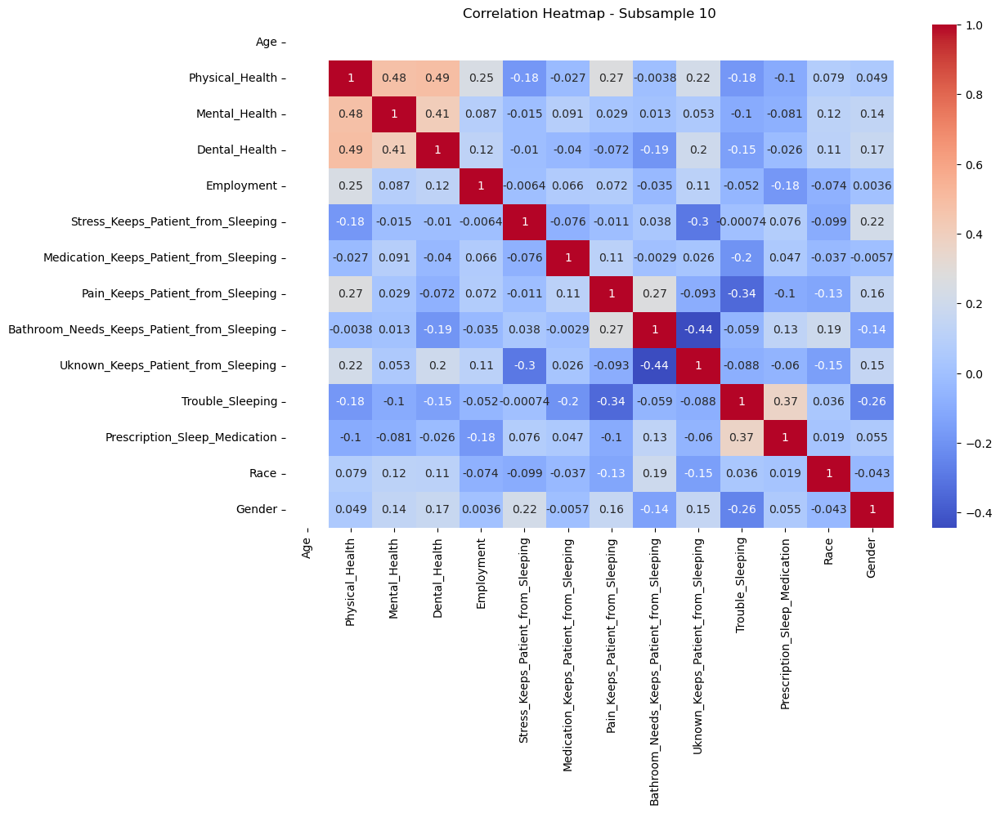

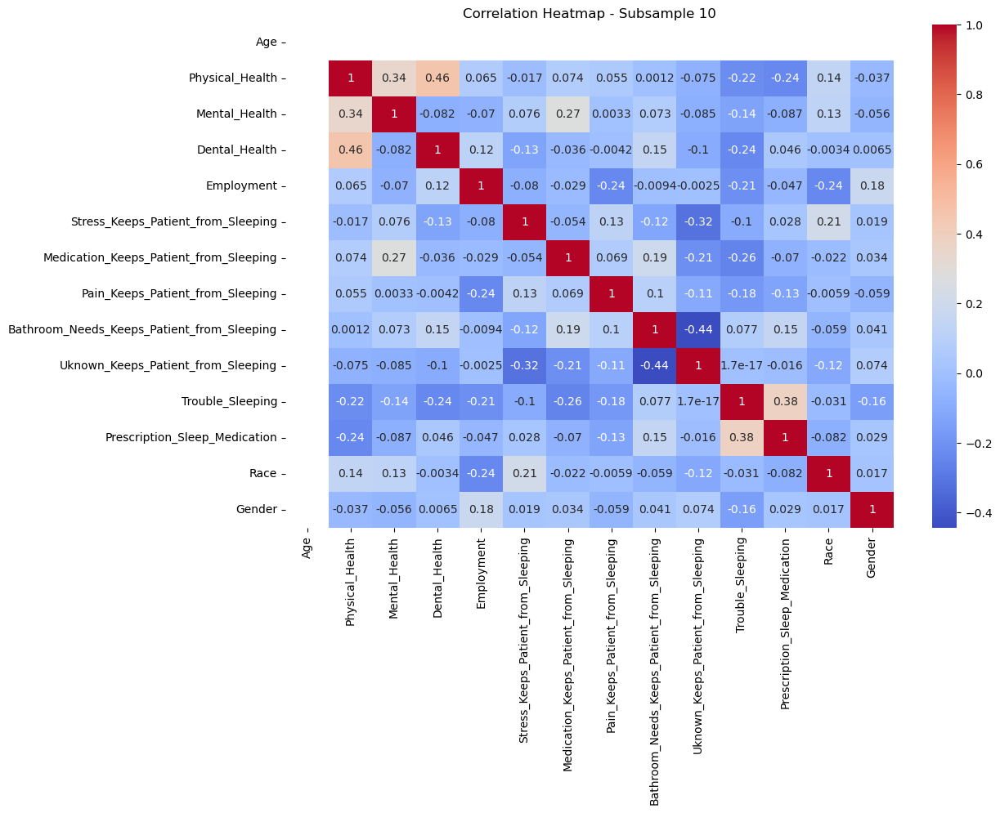

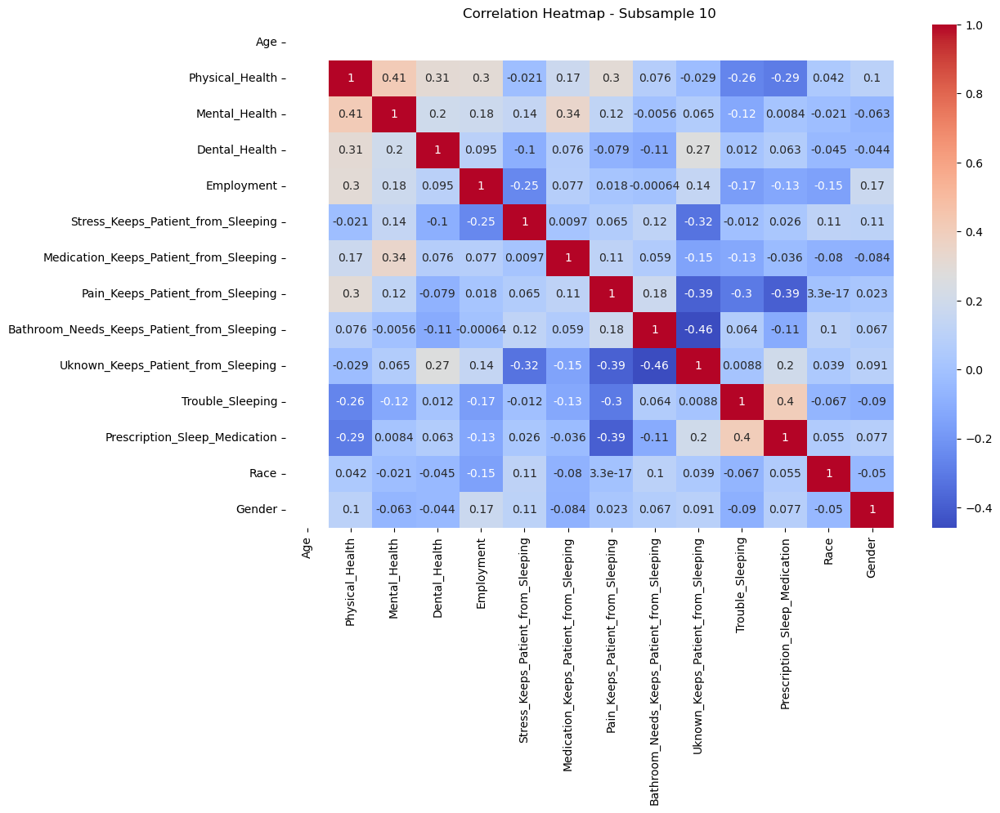

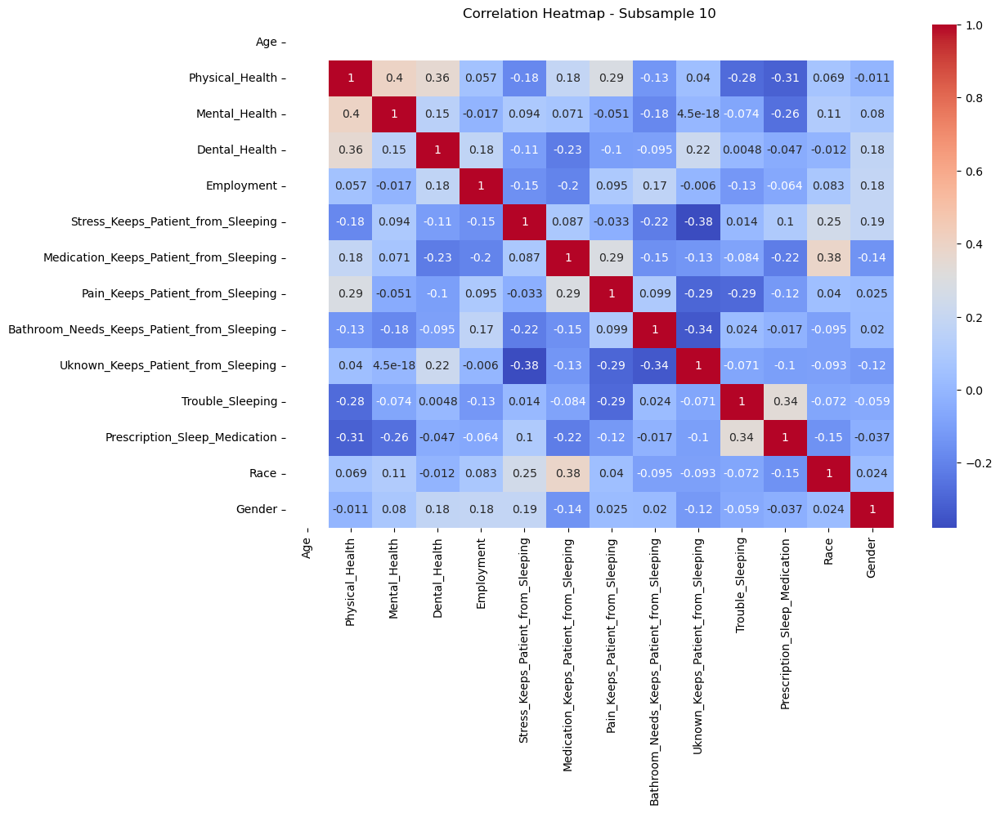

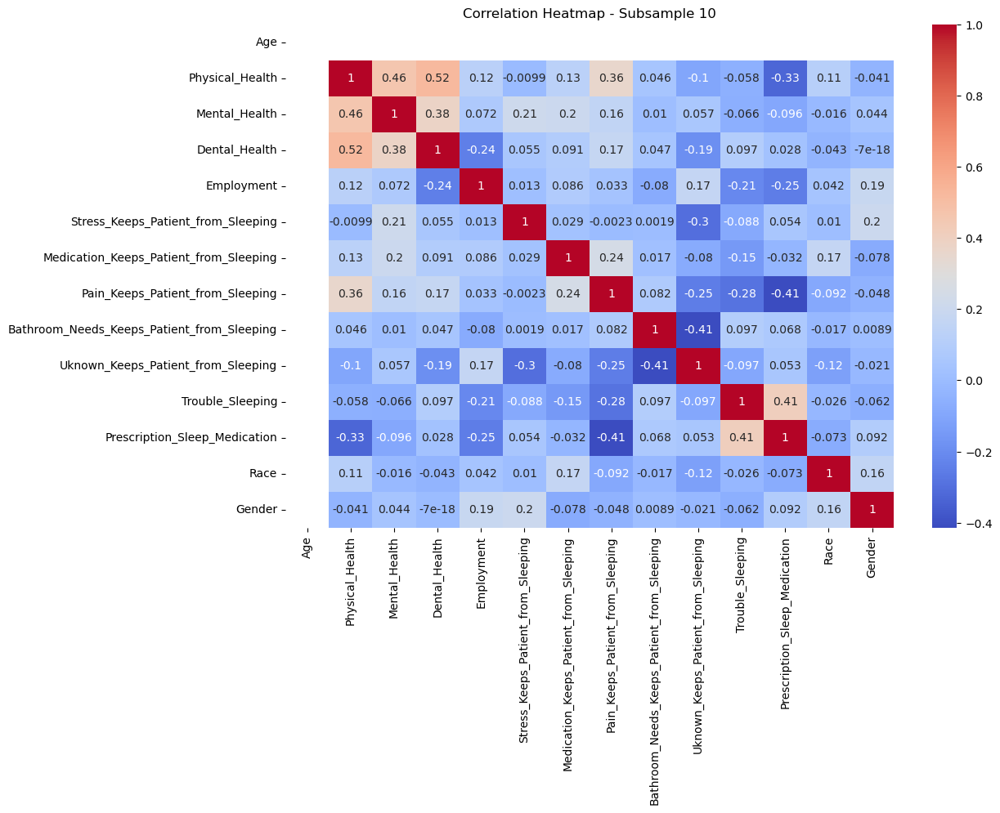

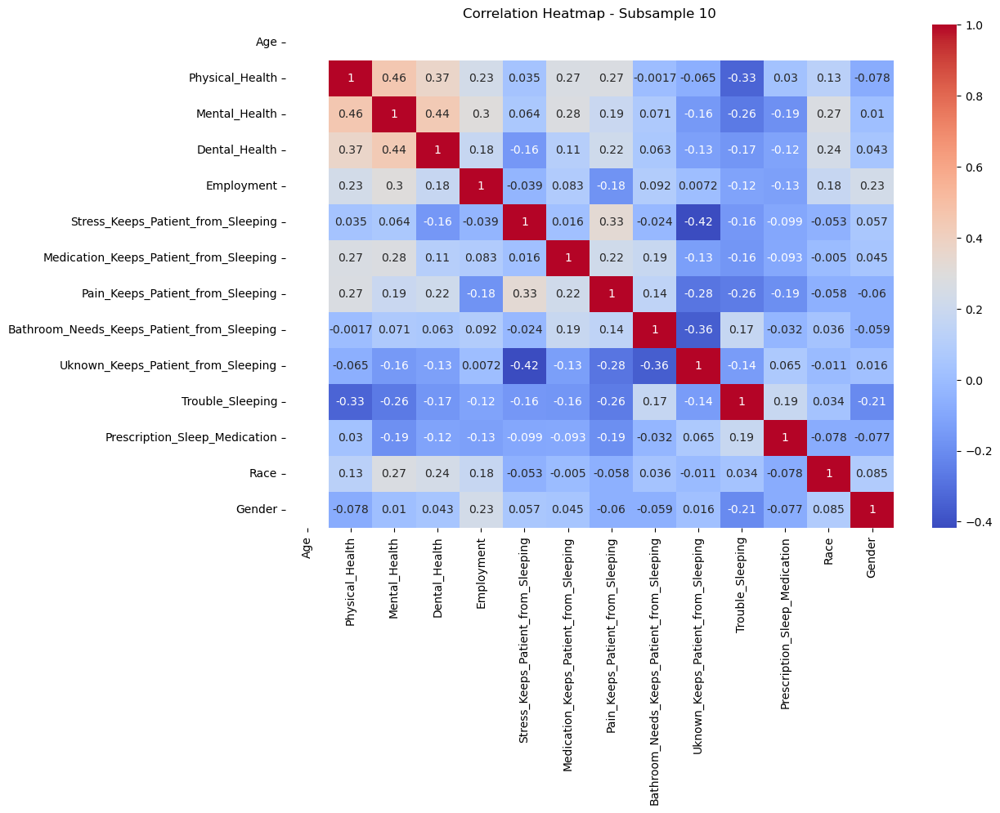

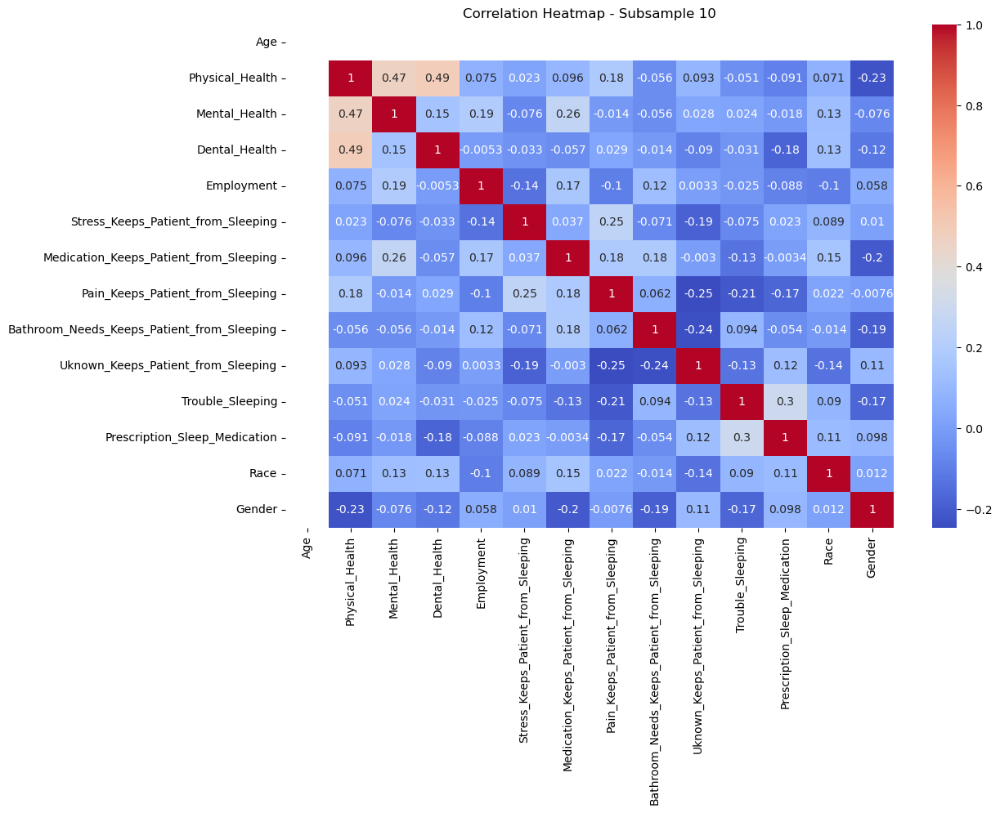

In [5]:
create_subsamples_and_plot_correlations(100)  # Adjust subsample_size as needed

**TASK (Classification): If your problem is a classification problem visually check if the target variable is imbalanced**

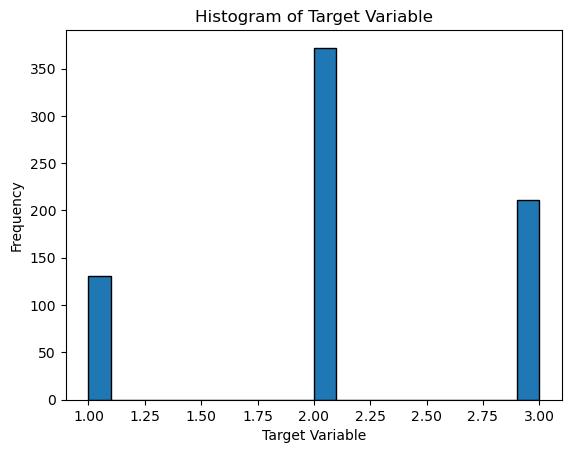

In [6]:
plt.hist(y, bins=20, edgecolor='black')
plt.xlabel('Target Variable')
plt.ylabel('Frequency')
plt.title('Histogram of Target Variable')
plt.show()

**TASK (Regression): If your problem is a regression problem visually the distribution of your target variabe**

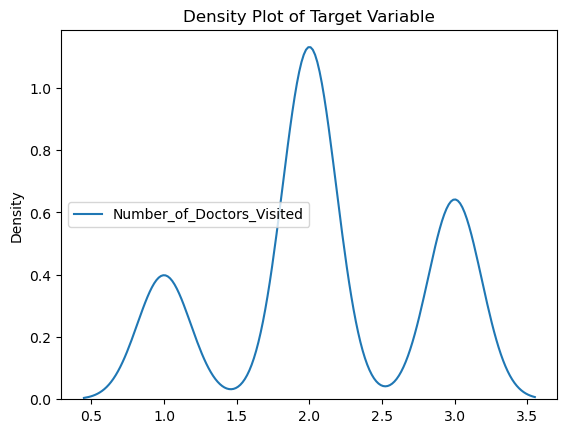

In [7]:
sns.kdeplot(y, color="darkblue")
plt.title('Density Plot of Target Variable')
plt.show()

**TASK: Take 10 moderately sized subsamples and create a pairplot of the feature variable in relation to the target variable**

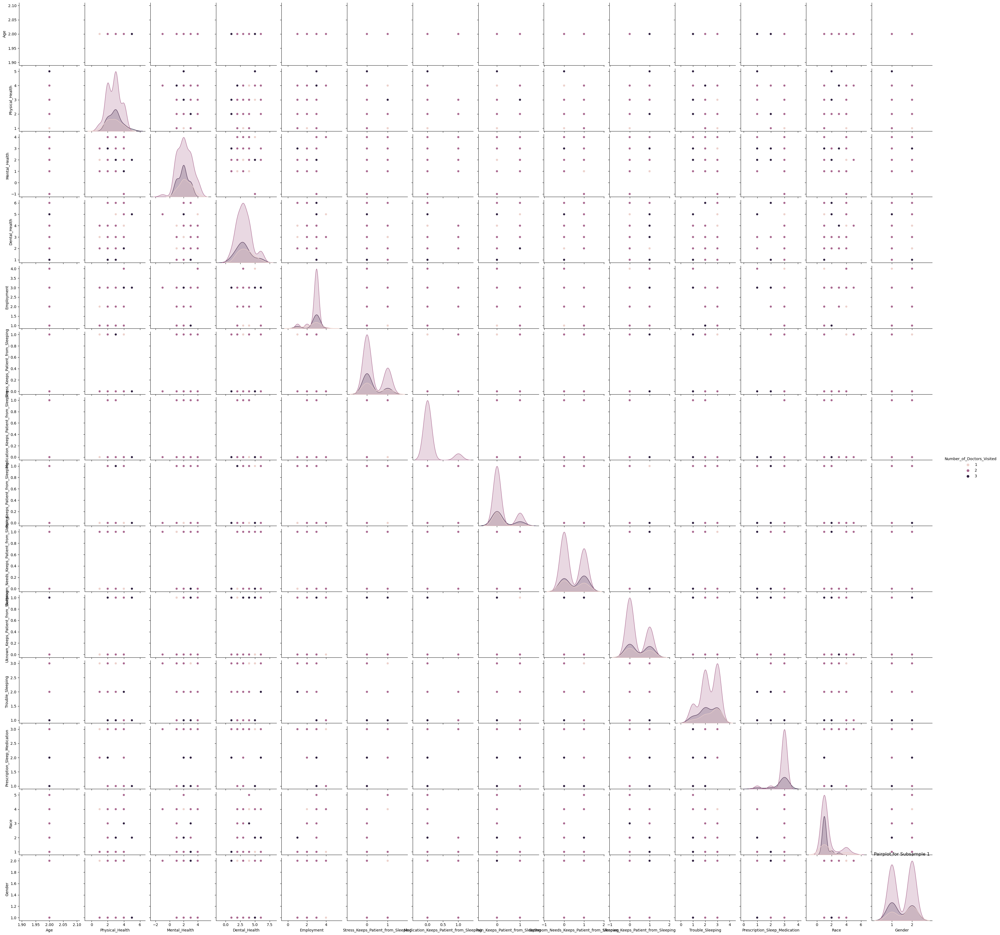

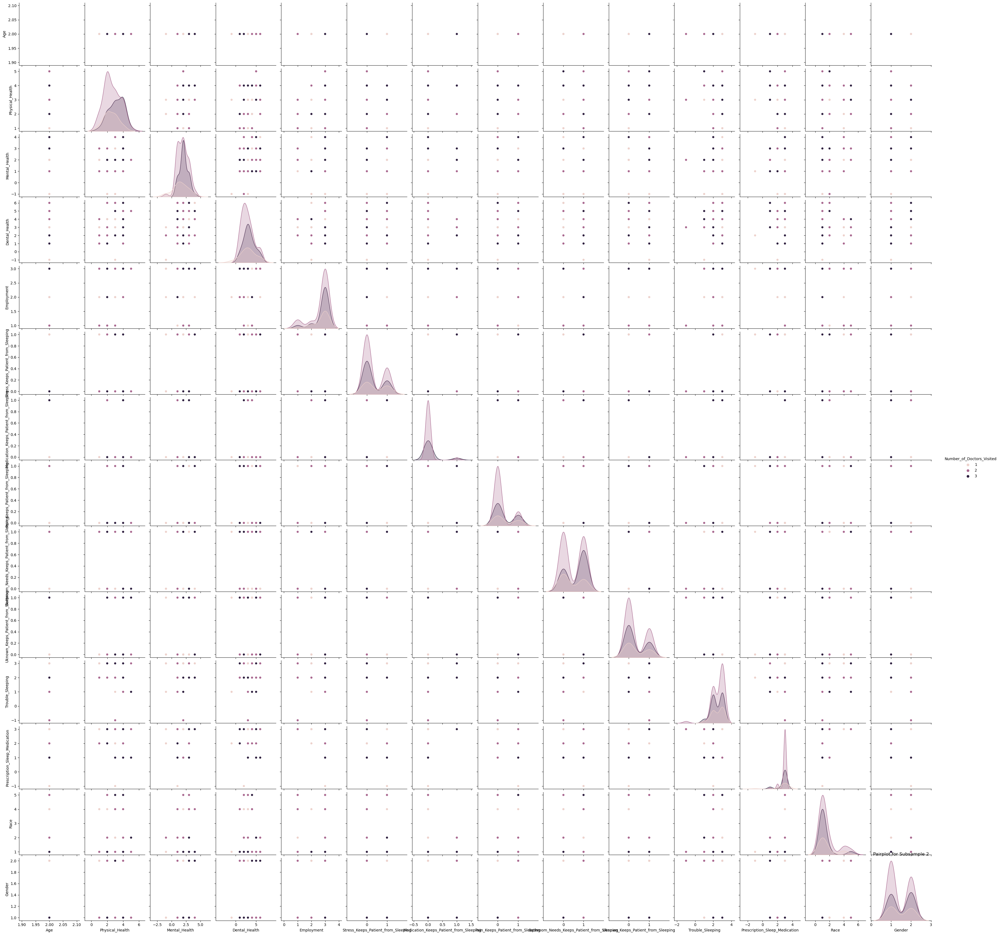

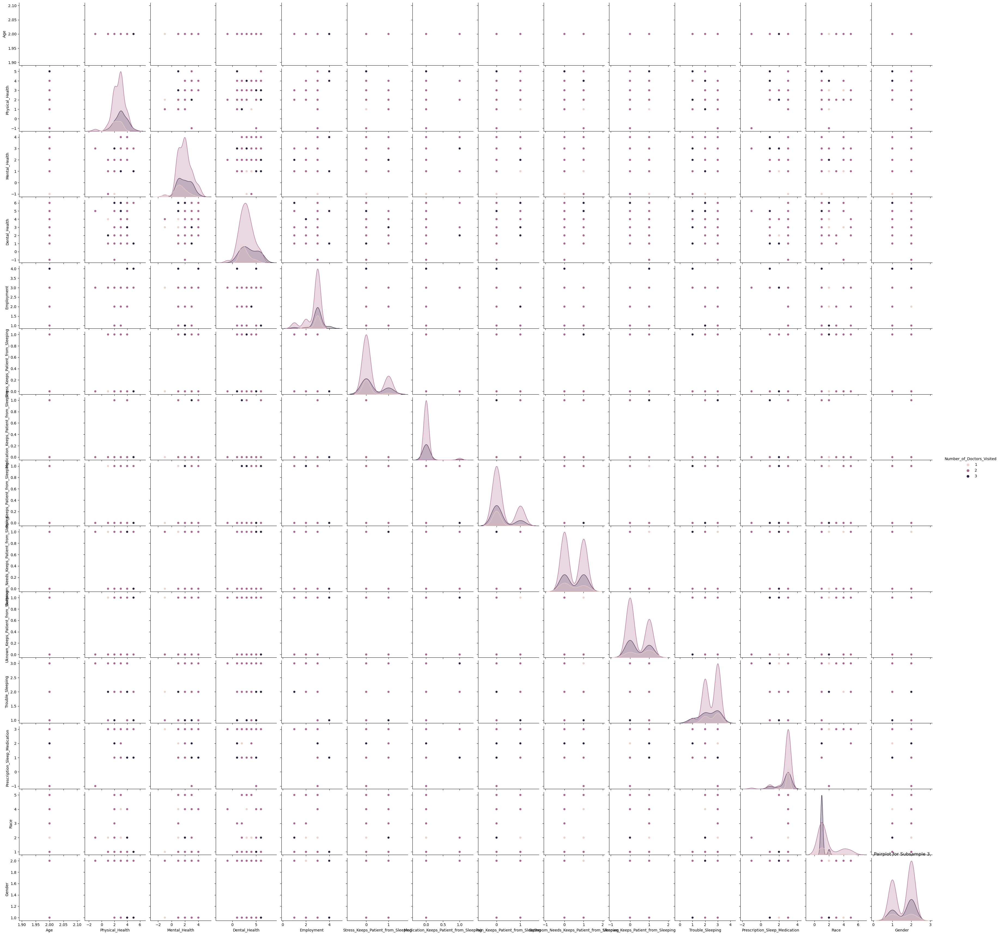

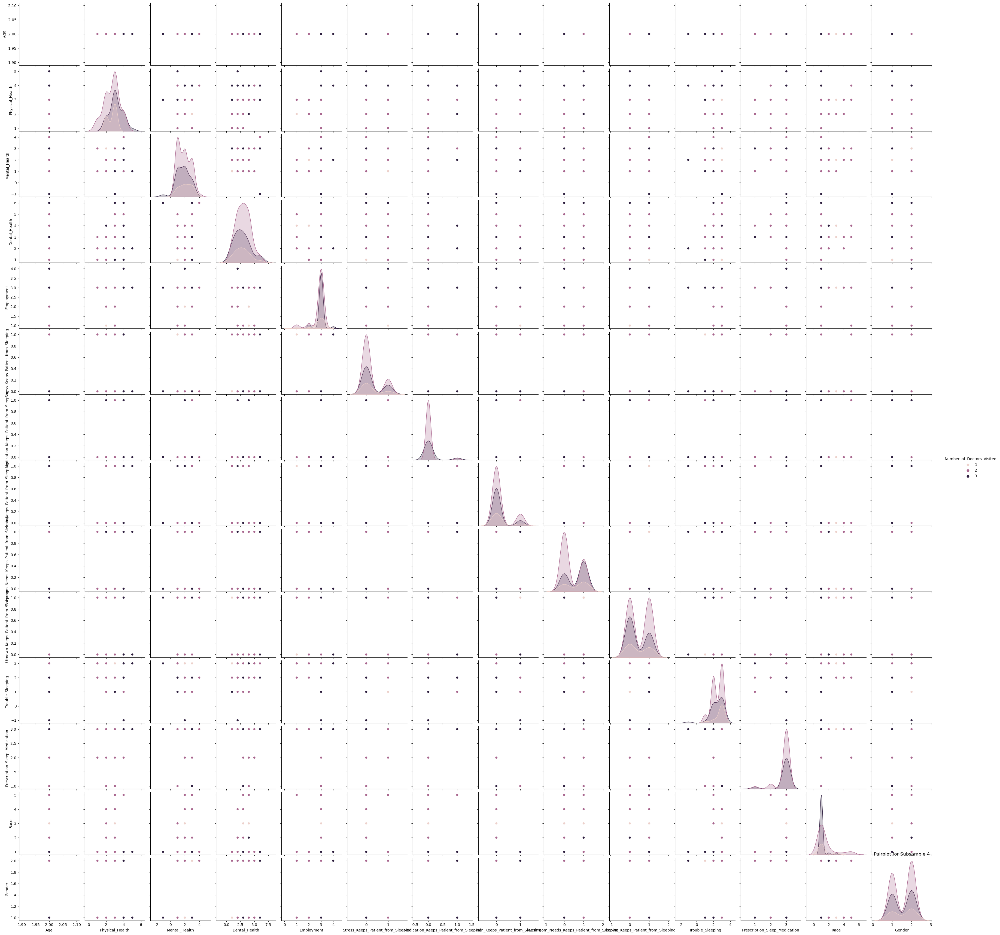

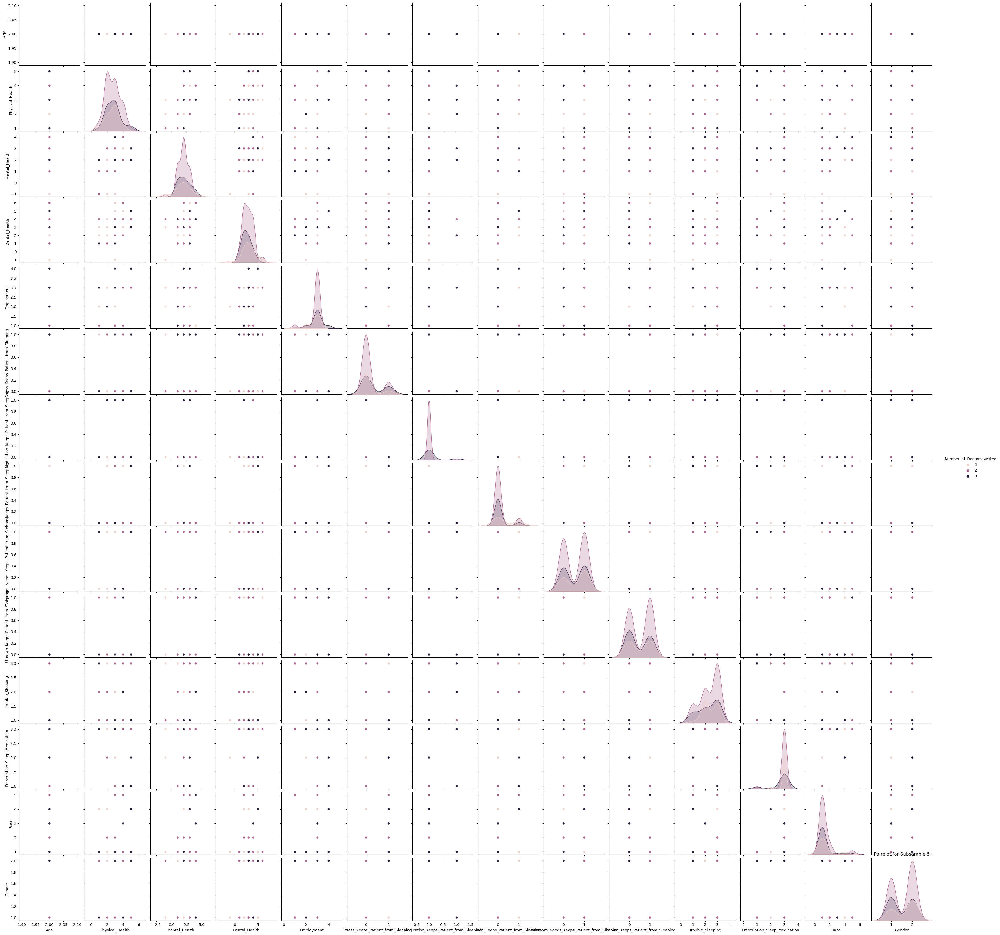

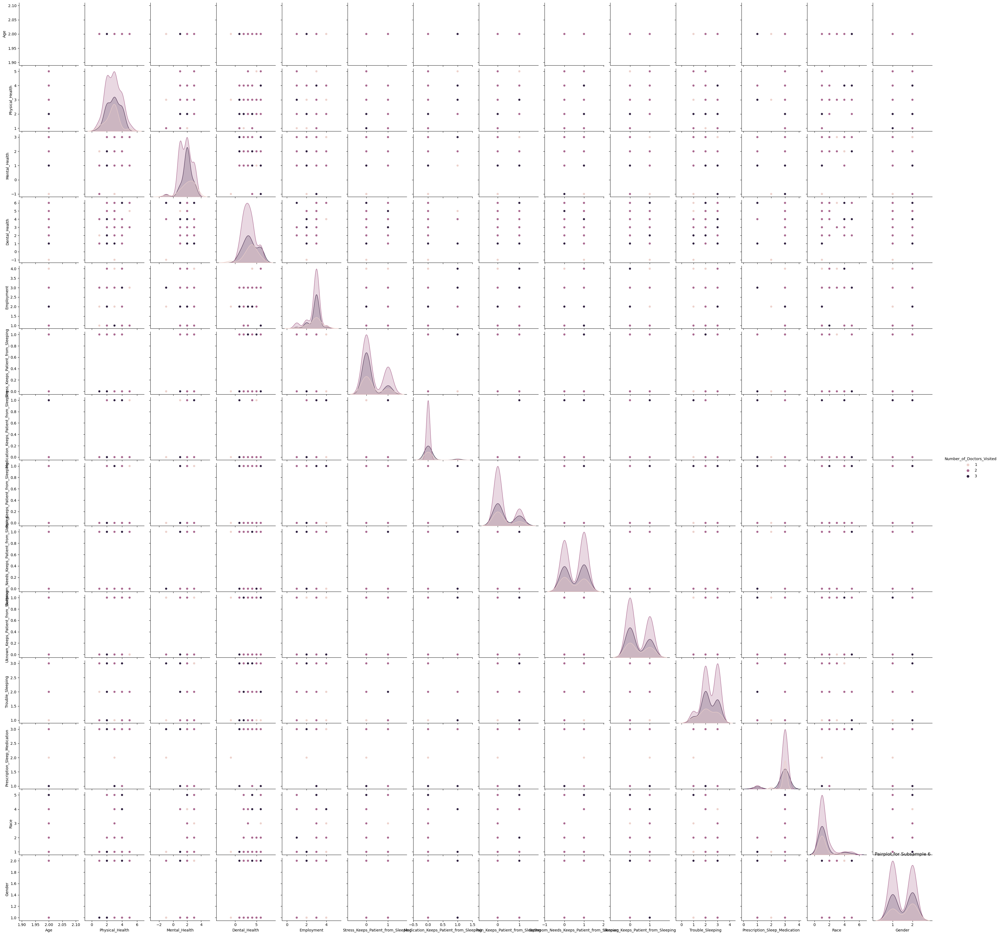

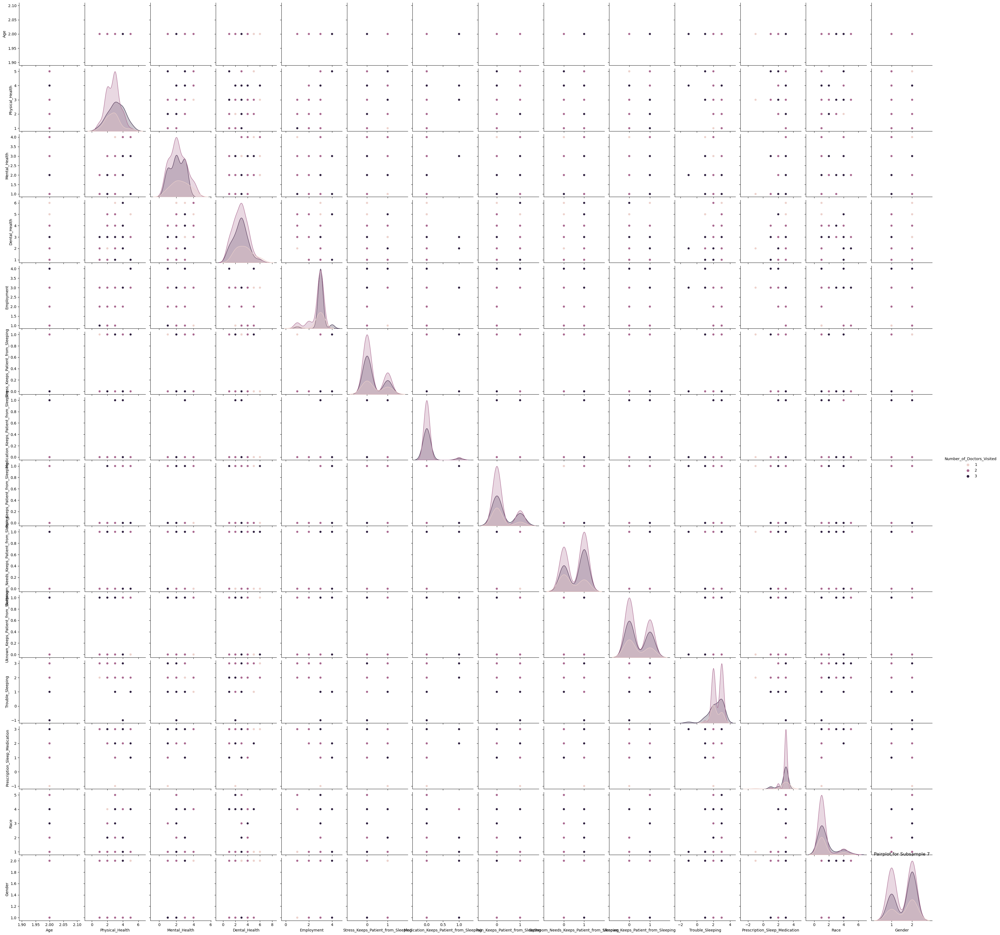

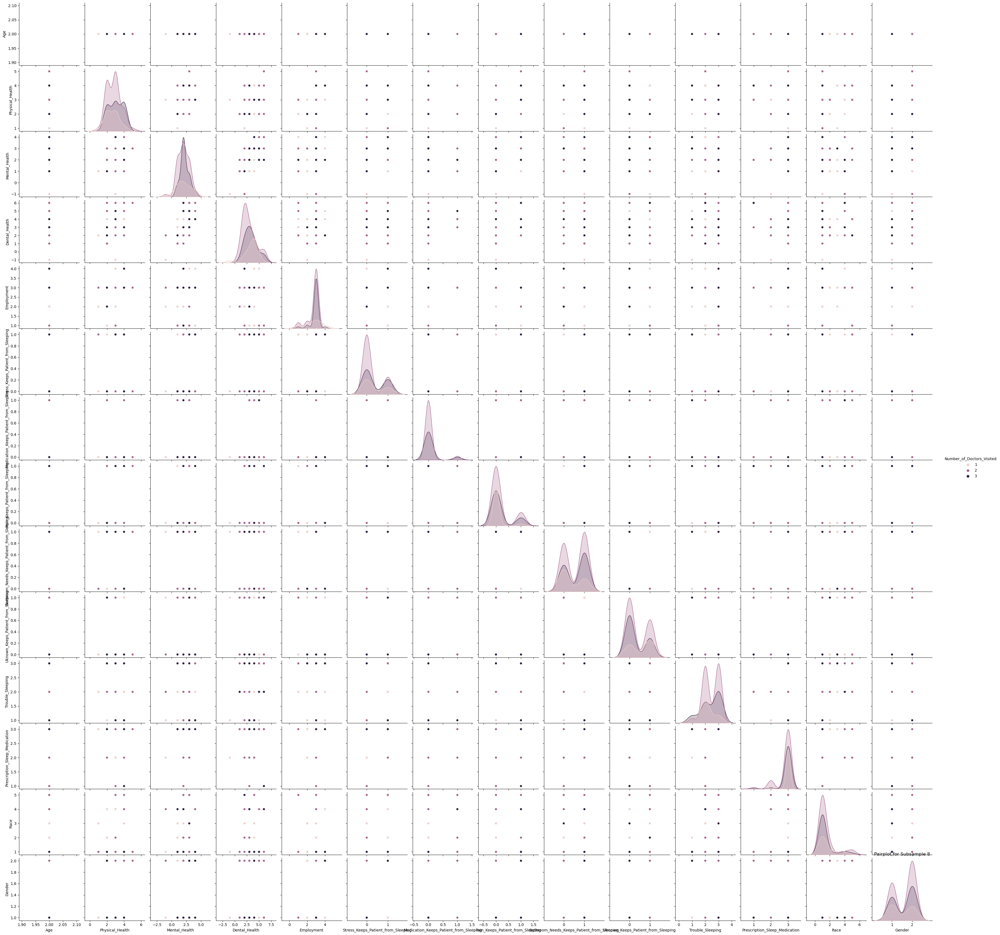

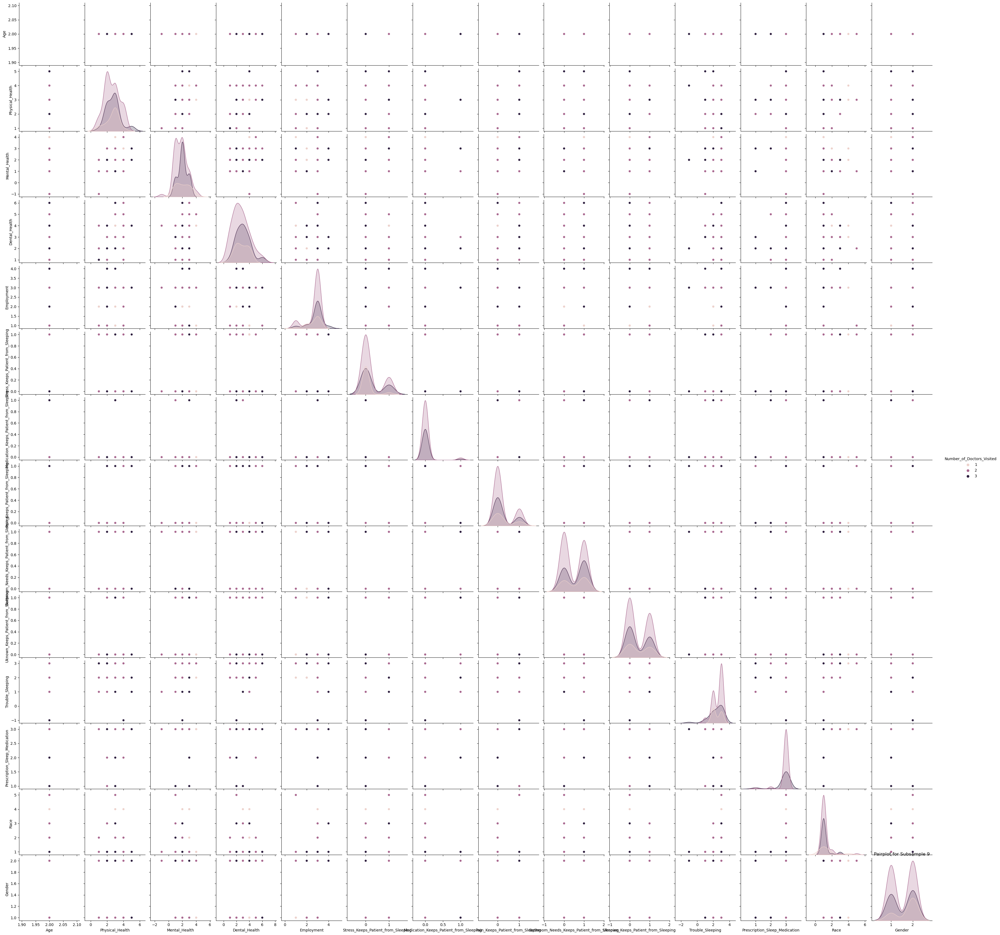

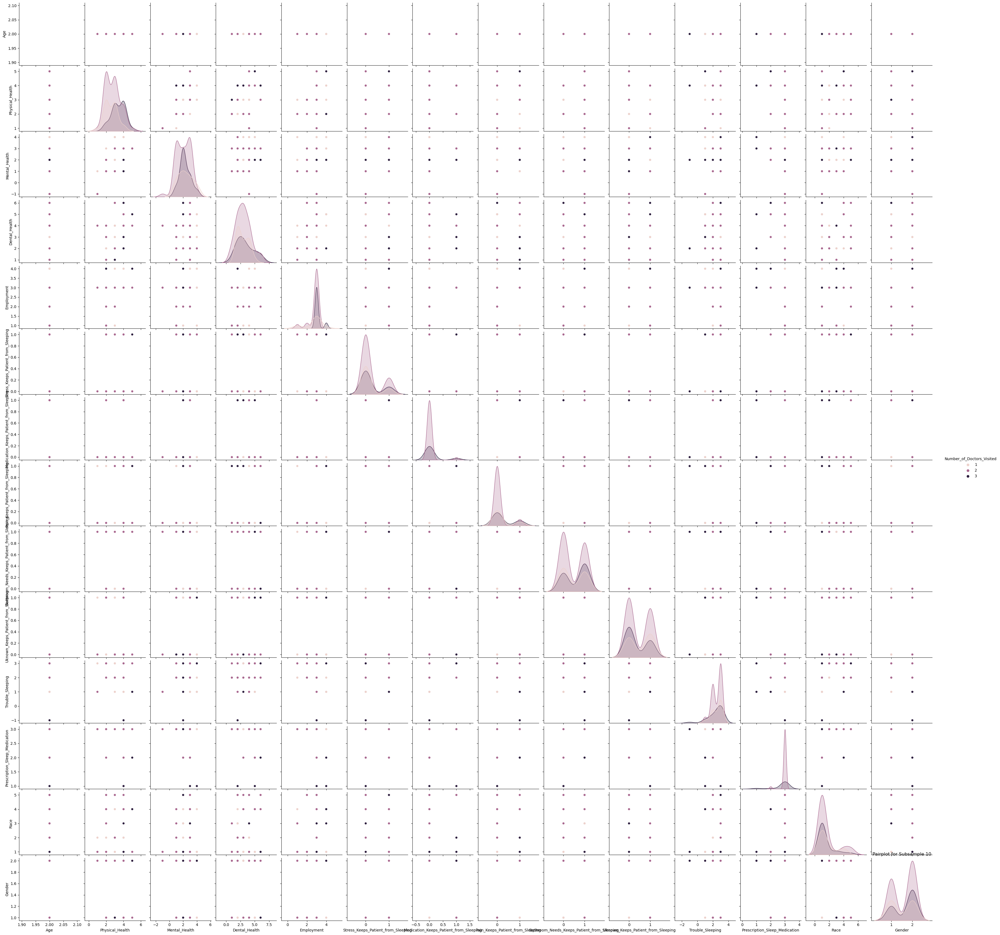

In [8]:
# Function to create pairplots
def create_pairplots(X, y, num_samples=10, sample_size=100):
    for i in range(num_samples):
        subsample_X = X.sample(n=sample_size, random_state=i)
        subsample_y = y.loc[subsample_X.index]
        subsample = pd.concat([subsample_X, subsample_y], axis=1)
        sns.pairplot(subsample, hue=subsample.columns[-1])
        plt.title(f'Pairplot for Subsample {i+1}')
        plt.show()

# Create pairplots
create_pairplots(X, y)

**TASK: Create a clustermap with seaborn to explore the relationships between variables.**

Any NaNs in the dataset: False
Any infinite values in the dataset: True


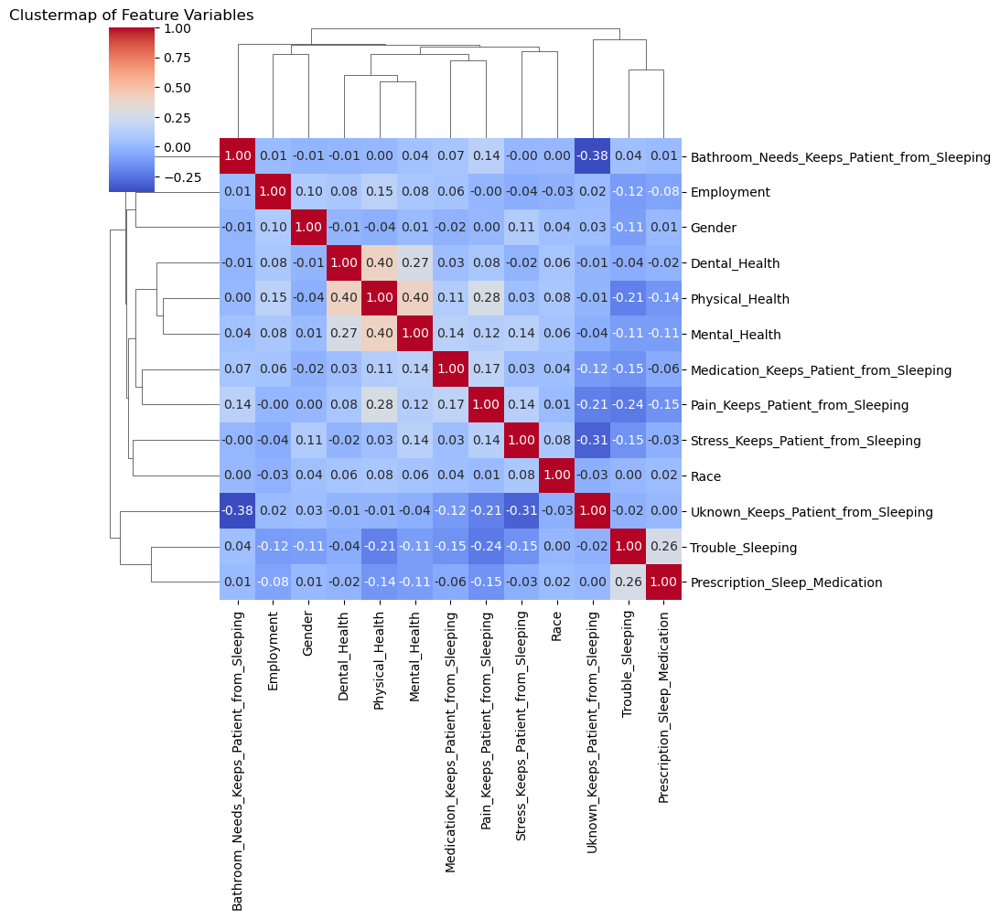

In [9]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Check for NaNs
print("Any NaNs in the dataset:", X.isnull().any().any())

# Replace NaNs with a finite value, e.g., 0
X = X.fillna(0)

# Check for infinite values
print("Any infinite values in the dataset:", np.isfinite(X).all().all())

# Replace infinite values with a finite value, e.g., the maximum finite value in the dataset
X = X.replace([np.inf, -np.inf], np.nan).fillna(0)

# Ensure all columns have non-unique values
X = X.loc[:, X.nunique() > 1]

# Create clustermap with a different metric if necessary
sns.clustermap(X.corr(), metric="euclidean", annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Clustermap of Feature Variables')
plt.show()

**TASK: Perform SVM modelling and check the performance of your model, improve the performance of your model using grdisearch**

In [10]:
# Import necessary libraries
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import classification_report

y = y.values.ravel()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize SVM model with class weights
svm_model = SVC(class_weight='balanced')

# Train the model
svm_model.fit(X_train, y_train)

# Predict and evaluate the model
y_pred = svm_model.predict(X_test)
print(classification_report(y_test, y_pred, zero_division=0))


              precision    recall  f1-score   support

           1       0.20      0.36      0.26        28
           2       0.55      0.24      0.34        74
           3       0.33      0.49      0.39        41

    accuracy                           0.34       143
   macro avg       0.36      0.36      0.33       143
weighted avg       0.42      0.34      0.34       143



In [12]:
# Improve model performance using GridSearchCV
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'gamma': [1, 0.1, 0.01, 0.001],  # Kernel coefficient
    'kernel': ['linear', 'rbf', 'poly']  # Type of kernel
}


grid_search = GridSearchCV(SVC(class_weight='balanced'), param_grid, scoring='accuracy', cv=5, verbose=2)
grid_search.fit(X_train, y_train)


# Best parameter set
print("Best parameters:", grid_search.best_params_)

# Best estimator
best_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred = best_model.predict(X_test)
print(classification_report(y_test, y_pred, zero_division=0))


Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END ......................C=0.1, gamma=1, kernel=linear; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   1.6s
[CV] END ........................C=0.1, gamma=1

[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END .......................C=1, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END ....................C=1, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ....................C=1, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ....................C=1, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ....................C=1, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ....................C=1, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ...................

[CV] END ......................C=100, gamma=0.1, kernel=poly; total time=   1.8s
[CV] END ......................C=100, gamma=0.1, kernel=poly; total time=   1.7s
[CV] END ......................C=100, gamma=0.1, kernel=poly; total time=   2.0s
[CV] END ......................C=100, gamma=0.1, kernel=poly; total time=   1.7s
[CV] END ......................C=100, gamma=0.1, kernel=poly; total time=   1.7s
[CV] END ...................C=100, gamma=0.01, kernel=linear; total time=   0.2s
[CV] END ...................C=100, gamma=0.01, kernel=linear; total time=   0.2s
[CV] END ...................C=100, gamma=0.01, kernel=linear; total time=   0.2s
[CV] END ...................C=100, gamma=0.01, kernel=linear; total time=   0.2s
[CV] END ...................C=100, gamma=0.01, kernel=linear; total time=   0.3s
[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ...................